<a href="https://colab.research.google.com/github/youssefkamil/Nucleus-Breast-Cancer-Tumor-Segementation/blob/main/Nucleus_Breast_Cancer_Segementation_(Tumor).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

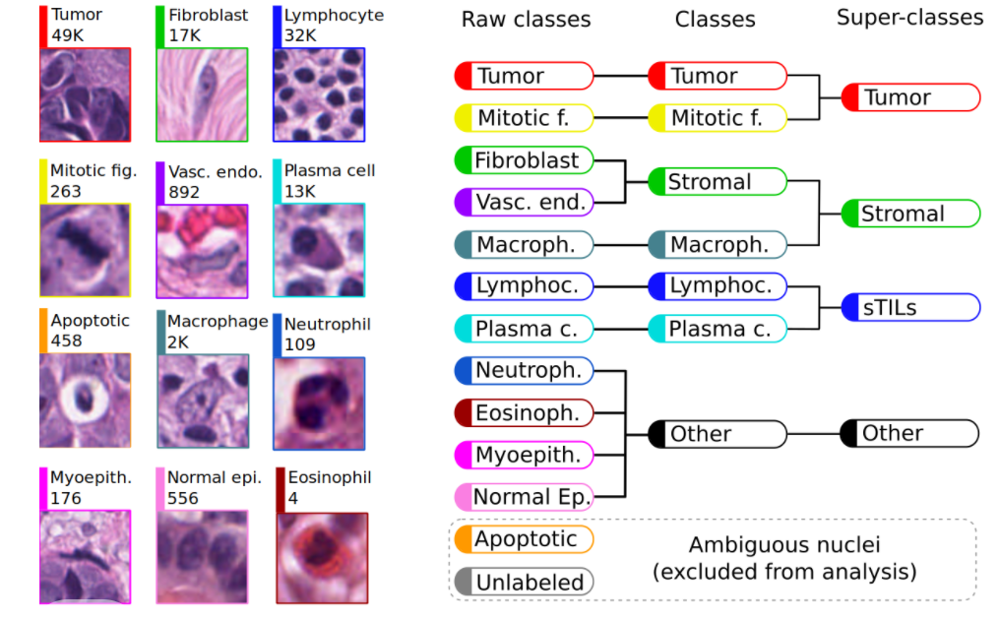

In [ ]:
import numpy as np
import pandas as pd
import os
import numpy as np
import cv2
import json
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
import tensorflow as tf
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
import numpy as np
import pandas as pd
import cv2

import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K
from tensorflow.keras import Input

from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dense, Flatten, Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import Adam


from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Data preparation

In [ ]:
LabelsList=[]
CsvPath="/content/drive/MyDrive/Breast Cancer Nuclies/csv"
ImgPath="/content/drive/MyDrive/Breast Cancer Nuclies/rgb"
VisPath="/content/drive/MyDrive/Breast Cancer Nuclies/visualization"
MaskPath="/content/drive/MyDrive/Breast Cancer Nuclies/mask"
MyMaskPath="/content/drive/MyDrive/Breast Cancer Nuclies/mymask"
listdir=os.listdir(CsvPath)
for dir in listdir:
    df=pd.read_csv(CsvPath+ '/' + dir)   
    LabelsList.append([dir.split(".")[0]+".png",df['raw_classification'].str.contains("tumor").any()*1])
df=pd.DataFrame(LabelsList,columns=["Name","Label"])

In [ ]:
df["Label"] = df["Label"].replace({0: 'NoTumor', 1: 'Tumor'}) 

In [ ]:
df["Label"].value_counts()

Tumor      1175
NoTumor     569
Name: Label, dtype: int64

In [ ]:
# Read Images
for i in range (10):
    plt.figure(figsize=(16, 8)) 
    img = mpimg.imread(ImgPath+"/"+df["Name"][i])
    plt.subplot(1,3,1)
    plt.imshow(img)
    vis = mpimg.imread(VisPath+"/"+df["Name"][i])
    plt.subplot(1,3,2)
    plt.imshow(vis)
    mask = mpimg.imread(MaskPath+"/"+df["Name"][i])
    plt.subplot(1,3,3)
    plt.imshow(mask)
    plt.show()

In [ ]:
dfcsv=pd.read_csv(CsvPath+ '/' + dir)
dfcsv

,Unnamed: 0,raw_classification,main_classification,super_classification,type,xmin,ymin,xmax,ymax,coords_x,coords_y
0,0,lymphocyte,lymphocyte,sTIL,polyline,264,153,298,188,"286,298,298,297,292,285,274,270,266,264,264,26...","153,153,163,180,185,188,185,183,178,167,166,16..."
1,1,lymphocyte,lymphocyte,sTIL,polyline,22,17,50,47,"22,29,33,39,48,49,50,49,43,36,24,22,22","35,20,17,17,21,25,38,42,46,47,46,41,35"
2,2,lymphocyte,lymphocyte,sTIL,polyline,275,254,303,284,"275,276,277,280,292,296,301,303,303,301,296,28...","268,261,258,254,254,258,265,272,277,281,284,28..."
3,3,plasma_cell,plasma_cell,sTIL,polyline,42,262,73,288,"47,42,48,49,58,66,70,73,73,71,70,66,54,47","286,280,270,269,264,262,264,267,270,274,277,28..."
4,4,lymphocyte,lymphocyte,sTIL,polyline,306,125,337,149,"311,307,306,306,311,316,323,329,334,337,337,33...","149,147,142,141,131,126,125,125,126,127,135,14..."
...,...,...,...,...,...,...,...,...,...,...,...
95,95,lymphocyte,lymphocyte,sTIL,rectangle,49,157,71,169,"49,71,71,49,49","157,157,169,169,157"
96,96,lymphocyte,lymphocyte,sTIL,rectangle,87,119,105,136,"87,105,105,87,87","119,119,136,136,119"
97,97,lymphocyte,lymphocyte,sTIL,rectangle,140,40,158,57,"140,158,158,140,140","40,40,57,57,40"
98,98,lymphocyte,lymphocyte,sTIL,rectangle,71,161,91,175,"71,91,91,71,71","161,161,175,175,161"


## Create our masks and save to drive
this cell to Create the masks on the tumor cells only by reading the csv files for every image and draw polylines where the tumor exists

then saving these masks to drive


In [ ]:
i=0
for imageName in df['Name']:
  i+=1
  print(i)
  imageCsv=pd.read_csv(CsvPath +'/'+ imageName.split('.')[0]+'.csv')
  image = cv2.imread(ImgPath+"/"+imageName)
  # cv2_imshow(image)
  blank_image = np.zeros((image.shape[0],image.shape[1],3), np.uint8)
  # imageCsv['raw_classification'].unique()
  for row in range(len(imageCsv)):
    x= [int(g) for g in imageCsv['coords_x'][row].split(",")]
    y= [int(g) for g in imageCsv['coords_y'][row].split(",")]
    xy=np.column_stack((x,y))
    colortumor = (255, 255, 255)
    # print(imageCsv['raw_classification'][row])
    if imageCsv['raw_classification'][row]=='tumor' :
      image = cv2.fillPoly(blank_image, [xy], colortumor)
    else:
      image=blank_image
  cv2_imshow(image) 
  cv2.imwrite("/content/drive/MyDrive/Breast Cancer Nuclies/mymask/"+imageName,image)

# Loading data

## Loading all the data in RAM

earlier we faced some issues in using image data generator

so we loaded all the data in RAM which somtimes caused crashing

In [ ]:
img_data_array=[]
mask_data_array=[]
i=0
for imageName in df['Name']:
  print(i)
  i+=1
  image= cv2.imread( ImgPath+"/"+imageName, cv2.COLOR_BGR2RGB)
  image=cv2.resize(image, (256, 256),interpolation = cv2.INTER_AREA)
  image=np.array(image)
  image = image.astype('float32')
  image /= 255 
  img_data_array.append(image)

  image= cv2.imread( MyMaskPath+"/"+imageName, cv2.COLOR_BGR2RGB)
  image=cv2.resize(image, (256, 256),interpolation = cv2.INTER_AREA)
  image=np.array(image)
  image = image.astype('float32')
  image /= 255 
  mask_data_array.append(image)
X=np.array(img_data_array)
y=np.array(mask_data_array)
X.shape, y.shape
# np.save("/content/drive/MyDrive/Breast Cancer Nuclies/img_data_array.npy",img_data_array)
# np.save("/content/drive/MyDrive/Breast Cancer Nuclies/img_data_array.npy",img_data_array)

In [ ]:
X=np.load("/content/drive/MyDrive/Breast Cancer Nuclies/img_data_array.npy")
y=np.load("/content/drive/MyDrive/Breast Cancer Nuclies/mask_data_array.npy")

## loading data using image data generator 
We used 3 different **ImageDataGenerator**

image_datagen for loading and generate the original (input) images

mask_datagen for loading and generate the masks (output)

vis_datagen loading and generate the visualization images which exist in the original dataset

**Validation split only 10%**


In [ ]:
# Data generator
#https://keras.io/preprocessing/image/
# Data generator
batch_sz = 16

from keras.preprocessing.image import ImageDataGenerator
# we create two instances with the same arguments

# VI Note: use the same seed for image_datagen and mask_datagen to ensure the transformation for image and mask is the same
data_gen_args = dict(rescale=1./255)

# So our usage here is as data loader instead of loading everything in RAM, not data augmentation
mask_gen_args = dict(rescale=1./255)

image_datagen = ImageDataGenerator(**data_gen_args,validation_split=0.1,
                                      rotation_range = 10, zoom_range=0.2,
                                   horizontal_flip=True, vertical_flip=True)
mask_datagen  = ImageDataGenerator(**mask_gen_args,validation_split=0.1,
                                      rotation_range = 10, zoom_range=0.2,
                                   horizontal_flip=True, vertical_flip=True) 
vis_datagen = ImageDataGenerator(**data_gen_args,validation_split=0.1,
                                      rotation_range = 10, zoom_range=0.2,
                                   horizontal_flip=True, vertical_flip=True)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1
#image_datagen.fit(images, augment=True, seed=seed)
#mask_datagen.fit(masks, augment=True, seed=seed)

image_generator = image_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    class_mode=None,
    classes=['rgb'],
    seed=seed,
    batch_size=batch_sz,
    target_size=(256,256),subset='training')

mask_generator = mask_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    classes=['mymask'],
    class_mode=None,
    seed=seed,
    color_mode='grayscale',
    batch_size=batch_sz,
    target_size=(256,256),subset='training')

vis_generator = vis_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    class_mode=None,
    classes=['visualization'],
    seed=seed,
    batch_size=batch_sz,
    target_size=(256,256),subset='training')


# combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator )

      

val_image_generator = image_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    class_mode=None,
    classes=['rgb'],
    seed=seed,
    batch_size=batch_sz,
    target_size=(256,256),
    subset='validation')


val_mask_generator = mask_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    classes=['mymask'],
    class_mode=None,
    seed=seed,
    batch_size=batch_sz,
    color_mode='grayscale',
    target_size=(256,256),
    subset='validation')

vis_generator = mask_datagen.flow_from_directory(
    '/content/drive/MyDrive/Breast Cancer Nuclies',
    classes=['visualization'],
    class_mode=None,
    seed=seed,
    batch_size=batch_sz,
    color_mode='rgb',
    target_size=(256,256),
    subset='validation')

# combine generators into one which yields image and masks
val_generator = zip(val_image_generator, val_mask_generator, vis_generator)

      

Found 1570 images belonging to 1 classes.
Found 1570 images belonging to 1 classes.
Found 1570 images belonging to 1 classes.
Found 174 images belonging to 1 classes.
Found 174 images belonging to 1 classes.
Found 174 images belonging to 1 classes.


In [ ]:
batch=next(train_generator)
for i in range(4):
  fig, axs = plt.subplots(1, 3,figsize=(15,15))
  axs[0].imshow(batch[0][i])
  axs[0].set_title("original")
  axs[1].imshow(batch[1][i].squeeze(axis=2))
  axs[1].set_title("mask")
  axs[2].imshow(batch[2][i])
  axs[2].set_title("visualization")
  fig.tight_layout()

In [ ]:
# Evaluation metrics: dice coefficient 
def dice_coef(y_true, y_pred, smooth = 1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


# Evaluation metrics: iou
def iou(y_true, y_pred, smooth = 1.):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true) + K.sum(y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def iou_loss(y_true, y_pred):
    return -iou(y_true, y_pred)

# IoU vs Dice Coefficient


##Explanation

###Youtube link
https://www.youtube.com/watch?v=AZr64OxshLo&ab_channel=SmartAlphaAI

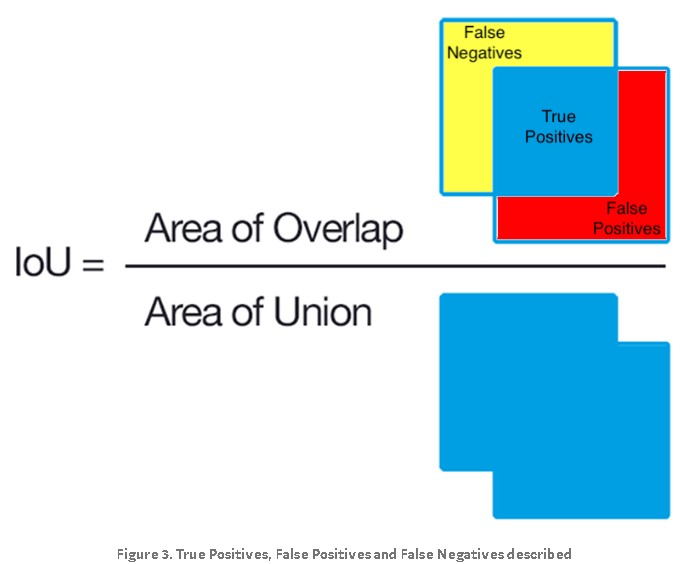

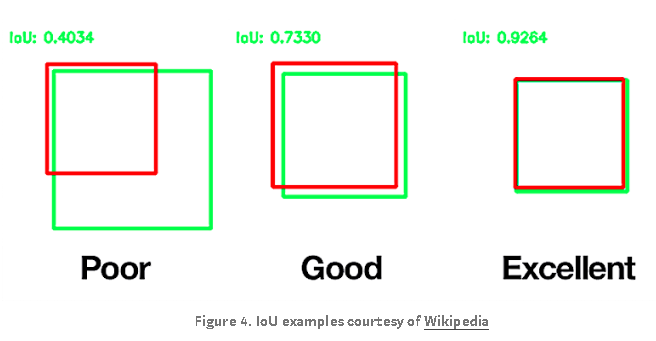


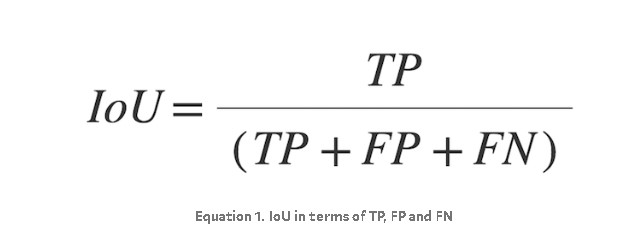



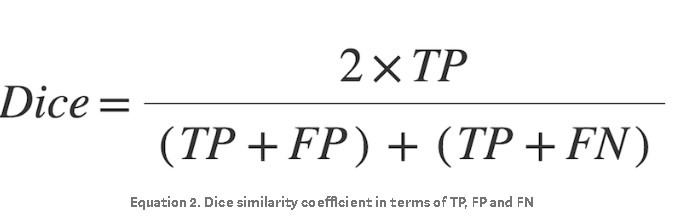

##Implemtation

In [ ]:
# Evaluation metrics: dice coefficient 
def dice_coef(y_true, y_pred, smooth = 1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


# Evaluation metrics: iou
def iou(y_true, y_pred, smooth = 1.):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true) + K.sum(y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def iou_loss(y_true, y_pred):
    return -iou(y_true, y_pred)

# UNET Model
**https://idiotdeveloper.com/unet-implementation-in-tensorflow-using-keras-api/**

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

In [ ]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x


In [ ]:
def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

In [ ]:
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

In [ ]:
def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="U-Net")
    return model

In [ ]:
input_shape = (256, 256, 3)
model = build_unet(input_shape)
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_85 (Conv2D)             (None, 256, 256, 64  1792        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_72 (BatchN  (None, 256, 256, 64  256        ['conv2d_85[0][0]']              
 ormalization)                  )                                                             

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model,to_file='new_unet_struct.png',show_shapes=True, show_layer_names=True)

from IPython.display import Image as IP_Image
IP_Image(retina=True, filename='new_unet_struct.png')


## Trainning

In [ ]:
from tensorflow import keras
# Vunet_model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model/.h5',compile=False)
# model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new.h5',compile=False)
model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies model best on val.h5',compile=False)

In [ ]:
model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, 
                    metrics=[iou, dice_coef, 'binary_accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
from keras.callbacks import CSVLogger
csv_logger = CSVLogger("model_history_log.csv", append=True)
model_checkpoint = ModelCheckpoint("/content/drive/MyDrive/Breast Cancer Nuclies model best on val.h5",
                                   monitor='val_binary_accuracy',
                                   verbose=1,
                                   save_best_only=True)


In [ ]:
history=model.fit(train_generator,validation_data=val_generator,
            epochs=50,
            steps_per_epoch=200, validation_steps=20,
            callbacks=[csv_logger, model_checkpoint])

Epoch 1/50
200/200 [==============================] - ETA: 0s - loss: -0.3540 - iou: 0.4518 - dice_coef: 0.6166 - binary_accuracy: 0.8703
Epoch 00001: val_binary_accuracy improved from 0.85787 to 0.86826, saving model to /content/drive/MyDrive/Breast Cancer Nuclies model best on val.h5
200/200 [==============================] - 222s 1s/step - loss: -0.3540 - iou: 0.4518 - dice_coef: 0.6166 - binary_accuracy: 0.8703 - val_loss: -0.3726 - val_iou: 0.4731 - val_dice_coef: 0.6386 - val_binary_accuracy: 0.8683
Epoch 2/50
200/200 [==============================] - ETA: 0s - loss: -0.3572 - iou: 0.4578 - dice_coef: 0.6231 - binary_accuracy: 0.8738
Epoch 00002: val_binary_accuracy did not improve from 0.86826
200/200 [==============================] - 212s 1s/step - loss: -0.3572 - iou: 0.4578 - dice_coef: 0.6231 - binary_accuracy: 0.8738 - val_loss: -0.3714 - val_iou: 0.4609 - val_dice_coef: 0.6259 - val_binary_accuracy: 0.8476
Epoch 3/50
200/200 [==============================] - ETA: 0s - l

## **Results**
**training accuracy** = 89%

**validation accuracy** = 86%

In [ ]:
history_df = pd.read_csv('model_history_log.csv')
history_df

In [ ]:
import matplotlib.pyplot as plt
acc = history_df['binary_accuracy']
val_acc = history_df['val_binary_accuracy']
loss = history_df['dice_coef']
val_loss = history_df['val_dice_coef']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training binary_accuracy')
plt.plot(epochs, val_acc, 'b', label='val_binary_accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
model.evaluate(val_generator , steps= 22)

22/22 [==============================] - 14s 644ms/step - loss: -0.3878 - iou: 0.5014 - dice_coef: 0.6645 - binary_accuracy: 0.8605


[-0.3878280520439148,
 0.5013986229896545,
 0.6645389199256897,
 0.8605192303657532]

### Results Visualization

In [ ]:
val_batch=next(val_generator)

In [ ]:
images=model.predict(val_batch[0])

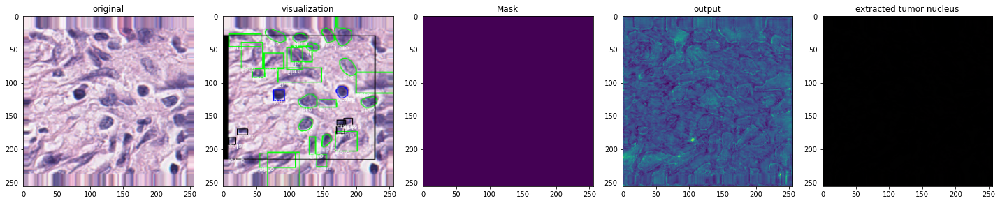

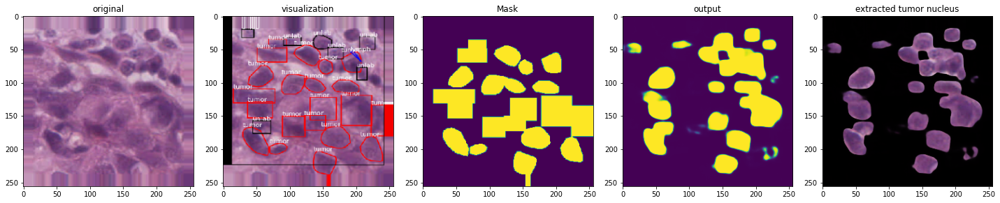

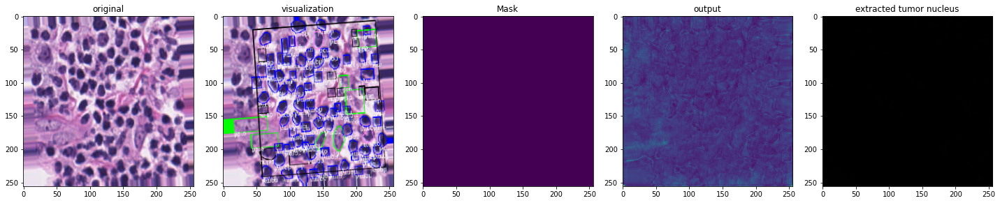

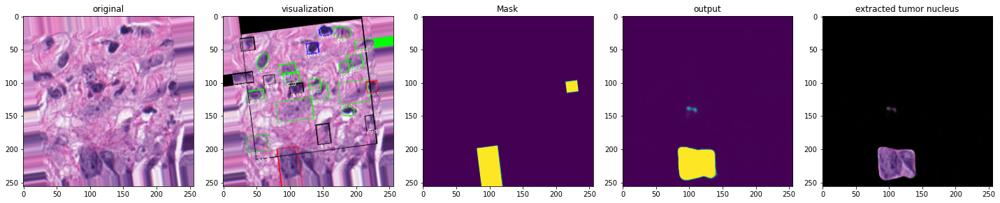

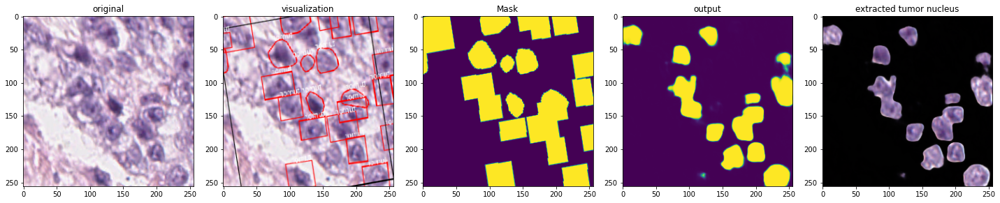

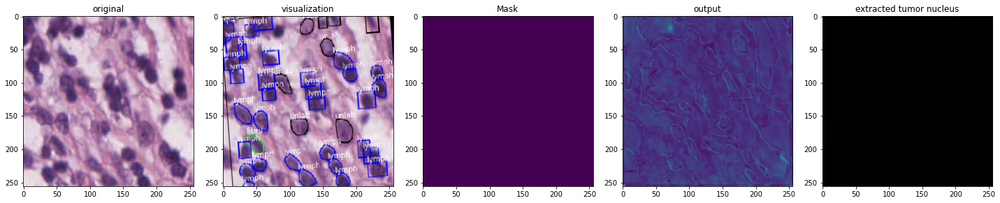

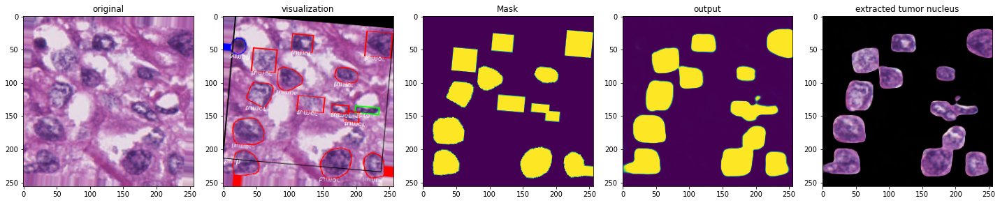

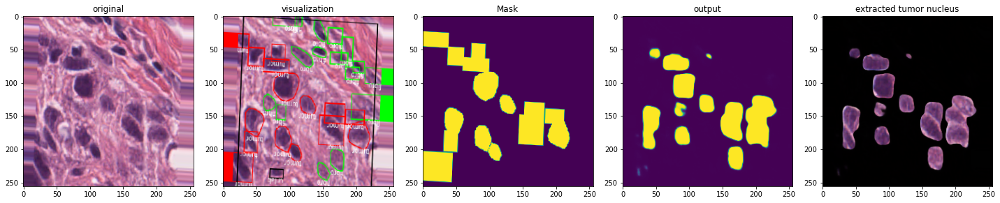

In [ ]:
for i in range(len(images)):
  fig, axs = plt.subplots(1, 5,figsize=(20,20))
  axs[0].imshow(val_batch[0][i])
  axs[0].set_title("original")
  axs[1].imshow(val_batch[2][i])
  axs[1].set_title("visualization")
  axs[2].imshow(val_batch[1][i].squeeze(axis=2))
  axs[2].set_title("Mask")
  axs[3].imshow(images[i].squeeze(axis=2))
  axs[3].set_title("output")
  axs[4].imshow(val_batch[0][i]*images[i])
  axs[4].set_title("extracted tumor nucleus")
  fig.tight_layout()

### Show the tumors on the orignal image

In [ ]:
def imageVis(image, mask):
  convertedimage=image.copy()
  for x in range(255):
    for y in range(255):
      if mask[x][y][0]>0.5:
        # print(mask[x][y])
        convertedimage[x][y]=image[x][y]*1.6
  return convertedimage


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


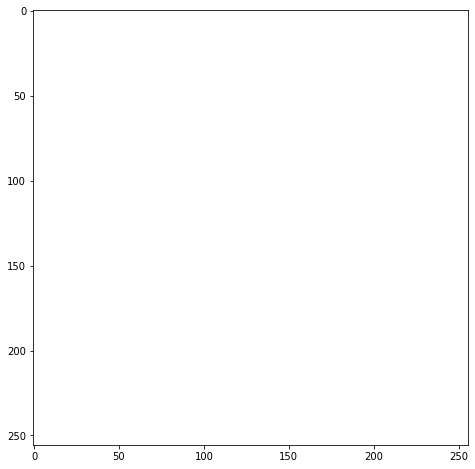

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
imagenumber=15
fig, ax = plt.subplots(figsize=(8,8))
ims=[]
im = ax.imshow(val_batch[0][imagenumber],animated=True)
ims.append([im])
im = ax.imshow(val_batch[2][imagenumber], animated=True)
ims.append([im])
im = ax.imshow(imageVis(val_batch[0][imagenumber],images[imagenumber]), animated=True)
ims.append([im])
ani = animation.ArtistAnimation(fig, ims, interval=1000,
                                repeat_delay=1000)
ani.save('dynamic_images.avi')
HTML(ani.to_jshtml())

# UNET + transfer learnig

https://github.com/dorltcheng/Transfer-Learning-U-Net-Deep-Learning-for-Lung-Ultrasound-Segmentation

In [ ]:
def TL_unet_model(input_shape):
    # input: input_shape (height, width, channels) 
    # return model
    input_shape = input_shape
    base_VGG = VGG16(include_top = False, 
                   weights = "imagenet", 
                   input_shape = input_shape)

    # freezing all layers in VGG16 
    # for layer in base_VGG.layers: 
    #     layer.trainable = False

    # the bridge (exclude the last maxpooling layer in VGG16) 
    bridge = base_VGG.get_layer("block5_conv3").output
    print(bridge.shape)

    # Decoder now
    up1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bridge)
    print(up1.shape)
    concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(concat_1)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)


    up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    print(up2.shape)
    concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_2)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)


    up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    print(up3.shape)
    concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_3)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)


    up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    print(up4.shape)
    concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_4)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)


    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)
    print(conv10.shape)

    model_ = Model(inputs=[base_VGG.input], outputs=[conv10])

    return model_


# Function for fine-tuning the model (unfreeze all layers) 
def finetune_unfreezeall(input_shape, base_model):
    input_shape = input_shape
    base_model = base_model
    
    # unfreeze the contracting path and freeze the expanding path
    for layer in base_model.layers:
        if layer.name in ['block1_conv1', 'block1_conv2', 'block1_pool',
                          'block2_conv1', 'block2_conv2', 'block2_pool', 
                          'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool',
                          'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool',
                          'block5_conv1', 'block5_conv2', 'block5_conv3']:
            layer.trainable = True
            
    return base_model    


# [Failed] Approach 2: Adding Batch Normalization layer after each conv
def BN_pretrained(input_shape):
    # input: input_shape (height, width, channels) 
    # return model
    input_shape = input_shape
    base_VGG = VGG16(include_top = False, 
                   weights = "imagenet", 
                   input_shape = input_shape)

    # Building the encoder
    inp = base_VGG.input
    conv1 = base_VGG.get_layer(name='block1_conv1')(inp)
    conv1 = BatchNormalization()(conv1)
    conv1 = base_VGG.get_layer(name='block1_conv2')(conv1)
    conv1 = BatchNormalization()(conv1)
    conv1 = base_VGG.get_layer(name='block1_pool')(conv1)
    
    conv2 = base_VGG.get_layer(name='block2_conv1')(conv1)
    conv2 = BatchNormalization()(conv2)
    conv2 = base_VGG.get_layer(name='block2_conv2')(conv2)
    conv2 = BatchNormalization()(conv2)
    conv2 = base_VGG.get_layer(name='block2_pool')(conv2)
    
    conv3 = base_VGG.get_layer(name='block3_conv1')(conv2)
    conv3 = BatchNormalization()(conv3)
    conv3 = base_VGG.get_layer(name='block3_conv2')(conv3)
    conv3 = BatchNormalization()(conv3)
    comv3 = base_VGG.get_layer(name='block3_conv3')(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = base_VGG.get_layer(name='block3_pool')(conv2)

    conv4 = base_VGG.get_layer(name='block4_conv1')(conv3)
    conv4 = BatchNormalization()(conv4)
    conv4 = base_VGG.get_layer(name='block4_conv2')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = base_VGG.get_layer(name='block4_conv3')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = base_VGG.get_layer(name='block4_pool')(conv4)
    
    conv5 = base_VGG.get_layer(name='block5_conv1')(conv4)
    conv5 = BatchNormalization()(conv5)
    conv5 = base_VGG.get_layer(name='block5_conv2')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = base_VGG.get_layer(name='block5_conv3')(conv5)
    conv5 = BatchNormalization()(conv5)

    # freezing all layers in VGG16 
    for layer in base_VGG.layers: 
        layer.trainable = False

    # the bridge (exclude the last maxpooling layer in VGG16) 
    bridge = base_VGG.get_layer("block5_conv3").output
    print(bridge.shape)
    
    
    # Decoder now
    up1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bridge)
    print(up1.shape)
    up1 = BatchNormalization()(up1)
    
    concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
    
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(concat_1)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)

    up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    print(up2.shape)
    up2 = BatchNormalization()(up2)
    
    concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
    
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_2)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)

    up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    print(up3.shape)
    up3 = BatchNormalization()(up3)
    
    concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
    
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_3)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)
    conv8 = BatchNormalization()(conv8)

    up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    print(up4.shape)
    up4 = BatchNormalization()(up4)
    
    concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
    
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_4)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)
    conv9 = BatchNormalization()(conv9)

    conv10 = Conv2D(3, (1, 1), activation='sigmoid')(conv9)
    print(conv10.shape)

    model_ = Model(inputs=[base_VGG.input], outputs=[conv10])

    return model_



# Model version 3 Cross domain pre-train with large XPIE dataset
# this is the U-Net model structure 
def unet_model_v3(input_shape):
    
    inp = Input(input_shape)
    
    # contracting path 
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inp)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(conv5)

    # Expanding path 
    up1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    print(up1.shape)
    
    concat_1 = concatenate([up1, conv4], axis=3)
    
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(concat_1)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)

    up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    print(up2.shape)
    
    concat_2 = concatenate([up2, conv3], axis=3)
    
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_2)
    conv7 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)

    up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    print(up3.shape)
    
    concat_3 = concatenate([up3, conv2], axis=3)
    
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_3)
    conv8 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)

    up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    print(up4.shape)
    
    concat_4 = concatenate([up4, conv1], axis=3)
    
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_4)
    conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)
    print(conv10.shape)

    model_ = Model(inputs=[inp], outputs=[conv10])
    
    return model_

In [ ]:
Vunet_model = unet_model_v3((256,256,3))

(None, 32, 32, 512)
(None, 64, 64, 256)
(None, 128, 128, 128)
(None, 256, 256, 64)
(None, 256, 256, 1)


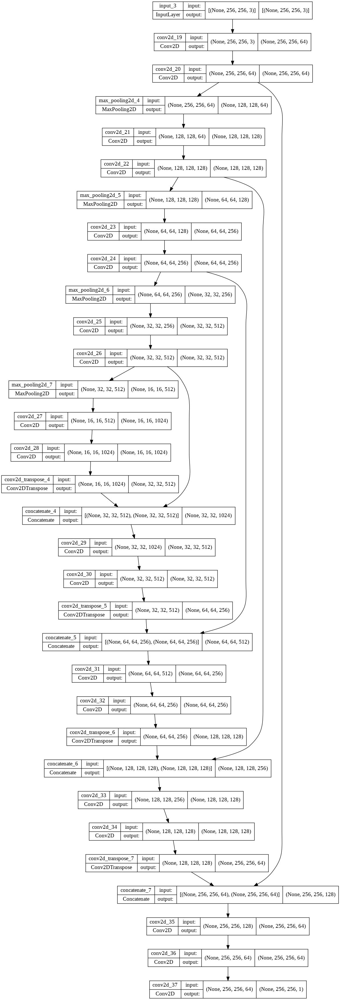

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(Vunet_model,to_file='new_unet_struct.png',show_shapes=True, show_layer_names=True)

from IPython.display import Image as IP_Image
IP_Image(retina=True, filename='new_unet_struct.png')


In [ ]:
layers = [(layer, layer.name, layer.trainable) for layer in Vunet_model.layers]
unet_model_df = pd.DataFrame(layers, columns=["Layer Type", "Layer Name", "Layer Trainable"])

display(unet_model_df)

In [ ]:
Vunet_model.summary()

## Model training

In [ ]:
from tensorflow import keras
# Vunet_model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model/.h5',compile=False)
# Vunet_model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new.h5',compile=False)
# Vunet_model = keras.models.load_model('/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new best on val.h5',compile=False)

In [ ]:
Vunet_model.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss, 
                    metrics=[iou, dice_coef, 'accuracy'])


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
from keras.callbacks import CSVLogger
csv_logger = CSVLogger("model_history_log.csv", append=True)

model_checkpoint = ModelCheckpoint("/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new best on val.h5",
                                   monitor='val_accuracy',
                                   verbose=1,
                                   save_best_only=True)

In [ ]:
history=Vunet_model.fit(train_generator,validation_data=val_generator,
            epochs=50,
            steps_per_epoch=100, validation_steps=10,
            callbacks=[csv_logger, model_checkpoint])

Epoch 1/50
100/100 [==============================] - ETA: 0s - loss: -0.6322 - iou: 0.4647 - dice_coef: 0.6329 - accuracy: 0.8695
Epoch 1: val_accuracy improved from 0.83804 to 0.84060, saving model to /content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new best on val.h5
100/100 [==============================] - 177s 2s/step - loss: -0.6322 - iou: 0.4647 - dice_coef: 0.6329 - accuracy: 0.8695 - val_loss: -0.3540 - val_iou: 0.4410 - val_dice_coef: 0.6085 - val_accuracy: 0.8406
Epoch 2/50
100/100 [==============================] - ETA: 0s - loss: -0.6375 - iou: 0.4687 - dice_coef: 0.6365 - accuracy: 0.8715
Epoch 2: val_accuracy improved from 0.84060 to 0.84436, saving model to /content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new best on val.h5
100/100 [==============================] - 162s 2s/step - loss: -0.6375 - iou: 0.4687 - dice_coef: 0.6365 - accuracy: 0.8715 - val_loss: -0.3666 - val_iou: 0.4653 - val_dice_coef: 0.6321 - val_accuracy: 0.8444
Epoch 3/50
100/100

KeyboardInterrupt: ignored

In [ ]:
Vunet_model.save("/content/drive/MyDrive/Breast Cancer Nuclies TL_unet_model new.h5")

## **Results**
**training accuracy** = 91%

**validation accuracy** = 88%

In [ ]:
Vunet_model.evaluate(val_generator, steps= 22)

22/22 [==============================] - 14s 644ms/step - loss: -0.4136 - iou: 0.5491 - dice_coef: 0.7058 - binary_accuracy: 0.8814


[-0.41355055570602417,
 0.5491256713867188,
 0.7058187127113342,
 0.8814025521278381]

In [ ]:
history_df = pd.read_csv('model_history_log.csv')
history_df

,epoch,accuracy,dice_coef,iou,loss,val_accuracy,val_dice_coef,val_iou,val_loss
0,0,0.491479,0.298745,0.181203,-0.172262,0.733579,0.439647,0.283957,-0.256767
1,0,0.744938,0.361253,0.225962,-0.205841,0.726022,0.483549,0.327416,-0.281706
2,1,0.734395,0.242292,0.149668,-0.131116,0.598716,0.462722,0.306615,-0.270709
3,2,0.580007,0.405750,0.258914,-0.229111,0.705093,0.481853,0.325054,-0.279780
4,3,0.791500,0.411199,0.268757,-0.231766,0.734705,0.496748,0.335664,-0.290293
5,4,0.705664,0.366549,0.228617,-0.216999,0.496487,0.415229,0.265423,-0.243181
6,5,0.538726,0.308947,0.187367,-0.181393,0.290787,0.360943,0.222921,-0.210545
7,6,0.381159,0.350315,0.213760,-0.195277,0.426969,0.405027,0.256844,-0.235439
8,0,0.651794,0.341331,0.226229,-0.341331,0.642288,0.486535,0.328294,-0.284808
9,1,0.639990,0.327977,0.215346,-0.327977,0.341887,0.374984,0.233178,-0.218726


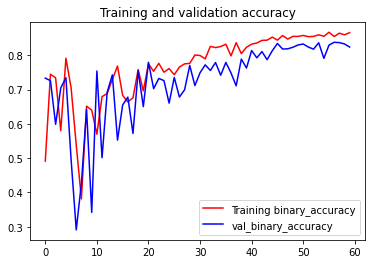

<Figure size 432x288 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
acc = history_df['accuracy']
val_acc = history_df['val_accuracy']
loss = history_df['dice_coef']
val_loss = history_df['val_dice_coef']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training binary_accuracy')
plt.plot(epochs, val_acc, 'b', label='val_binary_accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

### Results Visualization

In [ ]:
val_batch=next(val_generator)

In [ ]:
images=Vunet_model.predict(val_batch[0])

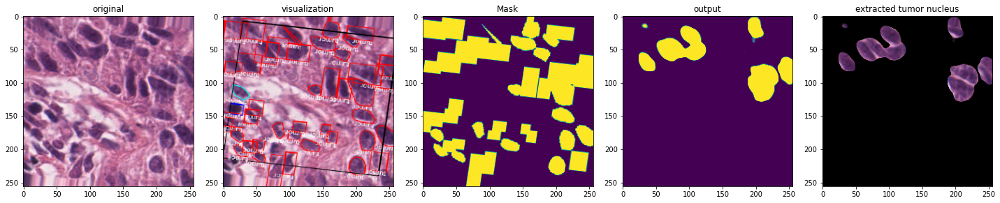

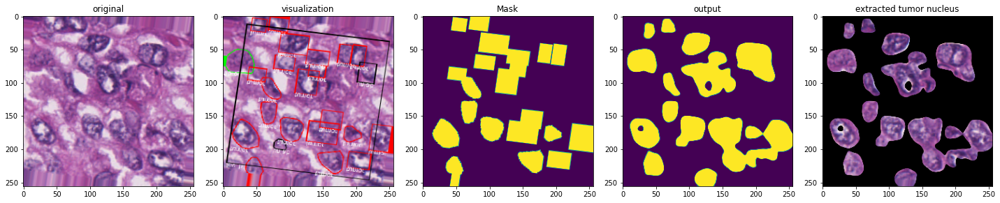

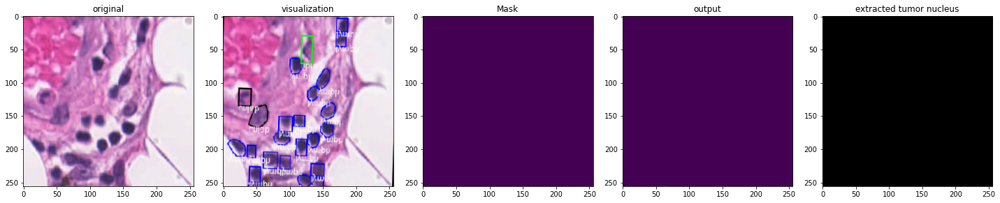

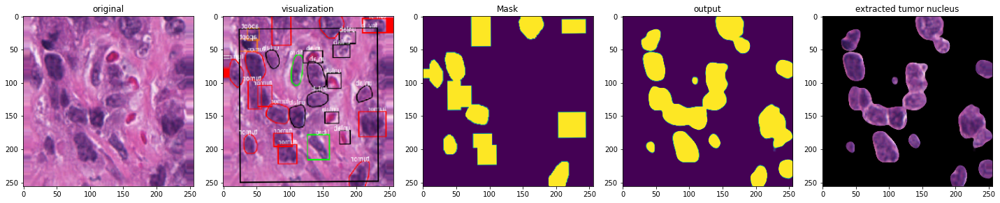

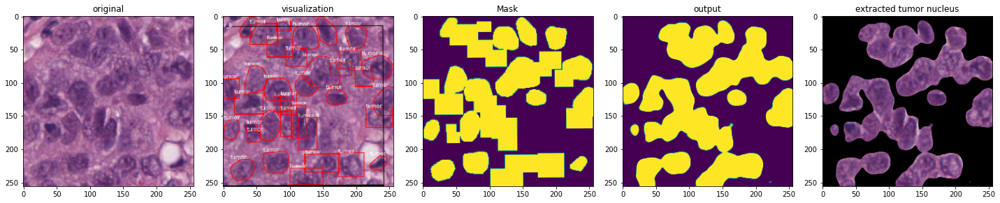

...

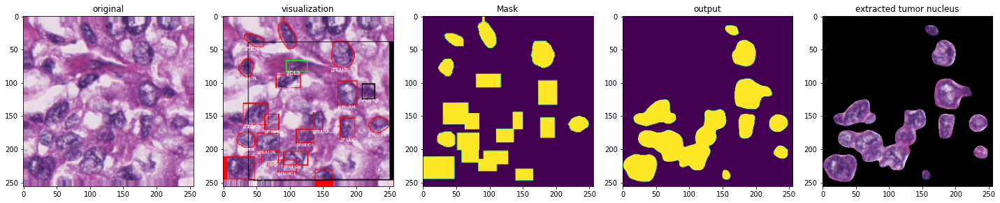

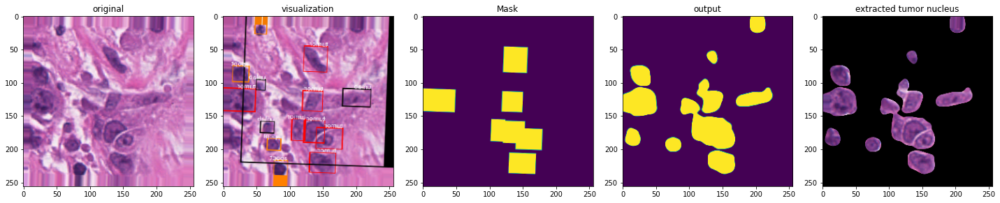

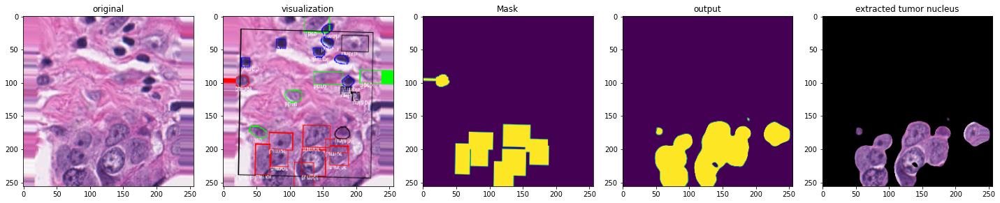

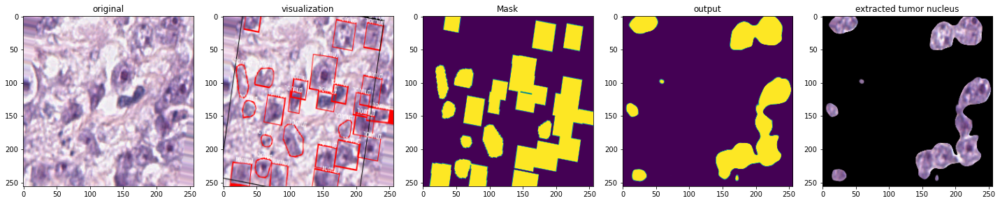

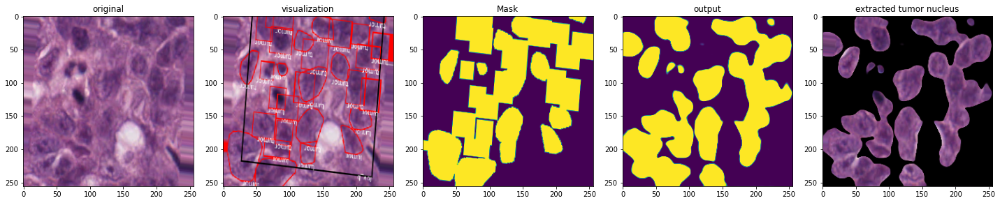

In [ ]:
for i in range(len(images)):
  fig, axs = plt.subplots(1, 5,figsize=(20,20))
  axs[0].imshow(val_batch[0][i])
  axs[0].set_title("original")
  axs[1].imshow(val_batch[2][i])
  axs[1].set_title("visualization")
  axs[2].imshow(val_batch[1][i].squeeze(axis=2))
  axs[2].set_title("Mask")
  axs[3].imshow(images[i].squeeze(axis=2))
  axs[3].set_title("output")
  axs[4].imshow(val_batch[0][i]*images[i])
  axs[4].set_title("extracted tumor nucleus")
  fig.tight_layout()

### Show the tumors on the orignal image

In [ ]:
def imageVis(image, mask):
  convertedimage=image.copy()
  for x in range(255):
    for y in range(255):
      if mask[x][y][0]>0.5:
        # print(mask[x][y])
        convertedimage[x][y]=image[x][y]*1.4
  return convertedimage


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


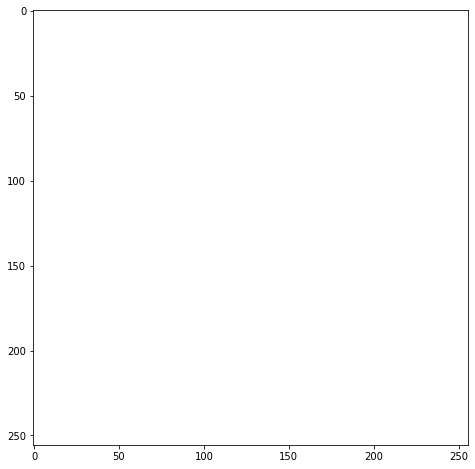

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
imagenumber=5
fig, ax = plt.subplots(figsize=(8,8))
ims=[]
im = ax.imshow(val_batch[0][imagenumber],animated=True)
ims.append([im])
im = ax.imshow(val_batch[2][imagenumber], animated=True)
ims.append([im])
im = ax.imshow(imageVis(val_batch[0][imagenumber],images[imagenumber]), animated=True)
ims.append([im])
ani = animation.ArtistAnimation(fig, ims, interval=1000,
                                repeat_delay=1000)
ani.save('dynamic_images.avi')
HTML(ani.to_jshtml())

# **To be done**

1- **decrease** the size of the boundary boxes to just indicate the centre of the tumor.

2- use **object detection** instead.

3- Continue with **Semantic Segmentation**.

4- try different **U-NET** Arch with different paramters.
